https://www.kaggle.com/datasets/martinmraz07/dc-metro-crime-data

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sns
import folium
from folium.plugins import HeatMap
from folium.plugins import MarkerCluster
import random
df = pd.read_csv("./DC_Crime_Data.csv")
df.head() #prime 5



,X,Y,CCN,REPORT_DAT,SHIFT,METHOD,OFFENSE,BLOCK,XBLOCK,YBLOCK,...,BLOCK_GROUP,CENSUS_TRACT,VOTING_PRECINCT,LATITUDE,LONGITUDE,BID,START_DATE,END_DATE,OBJECTID,OCTO_RECORD_ID
0,-77.013122,38.900761,21172055,2021/11/25 00:45:08+00,EVENING,OTHERS,THEFT F/AUTO,800 - 899 BLOCK OF NEW JERSEY AVENUE NW,398862.0,136989.0,...,004702 1,4702.0,Precinct 1,38.900753,-77.013119,MOUNT VERNON TRIANGLE CID,2021/11/25 00:27:00+00,2021/11/25 00:36:00+00,520976088,NaN
1,-77.036500,38.921854,21057211,2021/05/04 16:21:16+00,DAY,OTHERS,THEFT F/AUTO,2400 - 2479 BLOCK OF 16TH STREET NW,396835.0,139331.0,...,003801 1,3801.0,Precinct 24,38.921846,-77.036498,NaN,2021/05/03 16:40:06+00,2021/05/03 17:45:41+00,520976090,NaN
2,-77.042746,38.934175,21077218,2021/06/10 14:39:59+00,DAY,OTHERS,BURGLARY,1800 - 1899 BLOCK OF NEWTON STREET NW,396294.0,140699.0,...,002704 1,2704.0,Precinct 40,38.934167,-77.042744,NaN,2021/06/09 13:00:29+00,2021/06/10 14:40:09+00,520976100,NaN
3,-77.034578,38.906108,21078115,2021/06/12 05:25:32+00,MIDNIGHT,GUN,ROBBERY,1200 - 1219 BLOCK OF 15TH STREET NW,397001.0,137583.0,...,010100 1,10100.0,Precinct 17,38.906100,-77.034576,DOWNTOWN,2021/06/12 03:05:12+00,2021/06/12 03:45:56+00,520976101,NaN
4,-76.932725,38.898797,21077859,2021/06/11 20:51:35+00,EVENING,OTHERS,MOTOR VEHICLE THEFT,4800 - 4899 BLOCK OF NANNIE HELEN BURROUGHS AV...,405836.0,136773.0,...,007804 1,7804.0,Precinct 98,38.898789,-76.932723,NaN,2021/06/11 19:20:36+00,2021/06/11 19:22:18+00,520976110,NaN


About this file:

X: X-coordinate of the crime location in the projected coordinate system.
Y: Y-coordinate of the crime location in the projected coordinate system.
CCN (Complaint or Case Number): Unique identifier assigned to each reported crime.
REPORT_DAT: The date and time when the crime was reported to the authorities.
SHIFT: The police shift during which the crime was reported (e.g., Day, Evening, Midnight).
METHOD: The method used to commit the crime (e.g., Gun, Knife, Physical Force).
OFFENSE: The type of crime or offense committed (e.g., Theft, Assault, Burglary).
BLOCK: The block location where the crime occurred, usually indicating the street name and block number.
XBLOCK: X-coordinate of the crime location in a simplified grid system.
YBLOCK: Y-coordinate of the crime location in a simplified grid system.
WARD: The ward in which the crime took place, referring to one of the political divisions of the city.
ANC (Advisory Neighborhood Commission): The specific ANC area where the crime occurred, representing smaller community subdivisions.
DISTRICT: The police district responsible for the area where the crime occurred.
PSA (Police Service Area): The specific police service area within a district where the crime occurred.
NEIGHBORHOOD_CLUSTER: The neighborhood cluster where the crime took place, grouping multiple neighborhoods for analysis.
BLOCK_GROUP: Census block group where the crime occurred, used for demographic analysis.
CENSUS_TRACT: Census tract number for the crime location, useful for socio-economic data analysis.
VOTING_PRECINCT: The voting precinct where the crime occurred, relevant for political and electoral studies.
LATITUDE: Latitude coordinate of the crime location.
LONGITUDE: Longitude coordinate of the crime location.
BID (Business Improvement District): Indicates if the crime occurred within a Business Improvement District, areas with increased public services funded by businesses.
START_DATE: The date and time when the crime is believed to have started.
END_DATE: The date and time when the crime is believed to have ended.
OBJECTID: Unique identifier for each record in the dataset, used for internal database management.
OCTO_RECORD_ID: Unique identifier assigned by the Office of the Chief Technology Officer for data management and integration purposes.

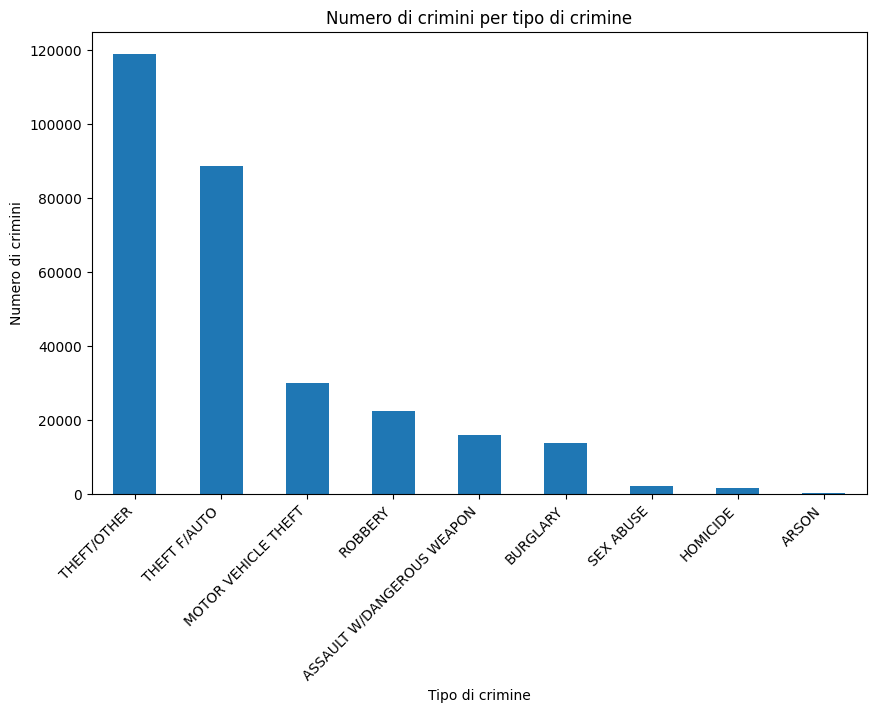

In [ ]:
offense_counts = df['OFFENSE'].value_counts()

plt.figure(figsize=(10, 6))
offense_counts.plot(kind='bar')
plt.title('Numero di crimini per tipo di crimine')
plt.xlabel('Tipo di crimine')
plt.ylabel('Numero di crimini')
plt.xticks(rotation=45, ha='right')
plt.show()

Si capisce che il crimine più diffuso è il furto semplice o altri reati minori. Da questo grafico vediamo anche che abbiamo pochissimi dati sull'incendio doloso per cui non lo prenderemo in considerazione(dato non significativo).

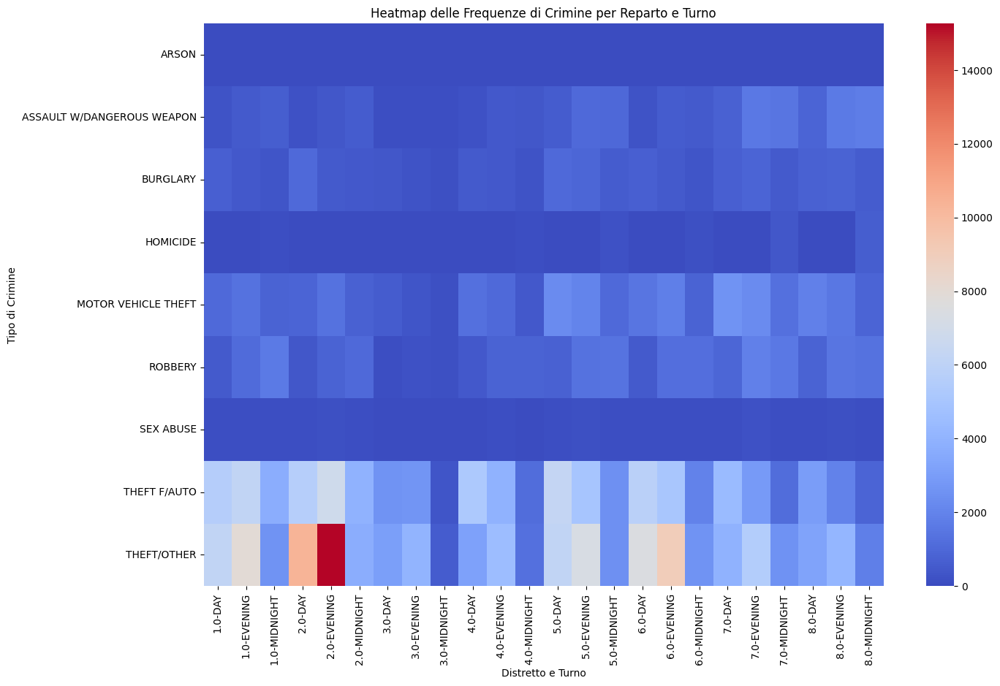

In [ ]:

pivot_table = df.pivot_table(values='CCN', index='OFFENSE', columns=['WARD', 'SHIFT'], aggfunc='count', fill_value=0)

plt.figure(figsize=(15, 10))
sns.heatmap(pivot_table, annot=False, cmap='coolwarm', cbar=True)
plt.title('Heatmap delle Frequenze di Crimine per Reparto e Turno')
plt.xlabel('Distretto e Turno')
plt.ylabel('Tipo di Crimine')
plt.show()


Abbiamo preso in considerazione i tipi di crimini commessi per reparto(ci sono 8 distretti in Washington DC) e turno(Giorno, Sera e Notte). Si vede chiaramente che nel distretto 2 di sera si verificano molti furti. Anche durante il giorno sempre nel distretto 2 si verificano diversi furti per cui da questo grafico sembra risultare che il distretto 2 sia quello su cui porre maggiore attenzione. Anche sui tipi di crimini possiamo dire che il furto è il crimine più comune ed è quello che già ci aspettavamo.

/tmp/ipykernel_58/1532501724.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[i], x=shift_counts.index, y=shift_counts.values, palette='muted')
/tmp/ipykernel_58/1532501724.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[i], x=shift_counts.index, y=shift_counts.values, palette='muted')
/tmp/ipykernel_58/1532501724.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[i], x=shift_counts.index, y=shift_counts.values, palette='muted')


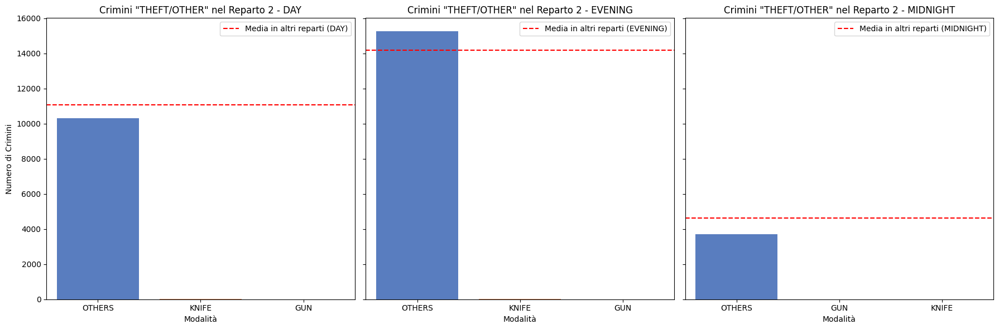

In [ ]:
df_ward2 = df[df['WARD'] == 2]

theft_other_df = df_ward2[df_ward2['OFFENSE'] == 'THEFT/OTHER']

shifts = ['DAY', 'EVENING', 'MIDNIGHT']

fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

for i, shift in enumerate(shifts):

    shift_df = theft_other_df[theft_other_df['SHIFT'] == shift]
    
    shift_counts = shift_df['METHOD'].value_counts()
    
    sns.barplot(ax=axes[i], x=shift_counts.index, y=shift_counts.values, palette='muted')
    
    other_wards_mean = df[(df['WARD'] != 2) & (df['OFFENSE'] == 'THEFT/OTHER') & (df['SHIFT'] == shift)]['METHOD'].value_counts().mean()
    axes[i].axhline(other_wards_mean, color='red', linestyle='--', label=f'Media in altri reparti ({shift})')
    
    axes[i].set_title(f'Crimini "THEFT/OTHER" nel Reparto 2 - {shift}')
    axes[i].set_xlabel('Modalità')
    axes[i].set_ylabel('Numero di Crimini')
    axes[i].legend()

plt.tight_layout()
plt.show()




Come avevamo già notato prima nel Reparto 2 si verificano più furti della media e da questo grafico vediamo che si verificano senza l'uso di armi quali coltelli o pistole. Si raccomanda un'incremento della sicurezza in quest'area.

/tmp/ipykernel_58/1658157701.py:3: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df['YearMonth'] = df['REPORT_DAT'].dt.to_period('M')


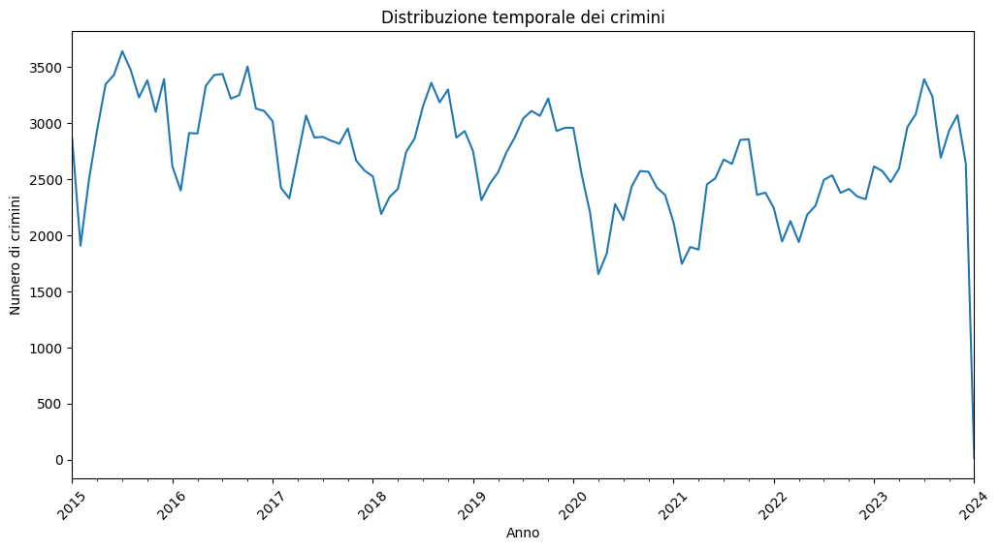

In [ ]:
df['REPORT_DAT'] = pd.to_datetime(df['REPORT_DAT'])

df['YearMonth'] = df['REPORT_DAT'].dt.to_period('M')

monthly_crimes = df['YearMonth'].value_counts().sort_index()

plt.figure(figsize=(12, 6))
monthly_crimes.plot(kind='line')
plt.title('Distribuzione temporale dei crimini')
plt.xlabel('Anno')
plt.ylabel('Numero di crimini')
plt.xticks(rotation=45)
plt.show()

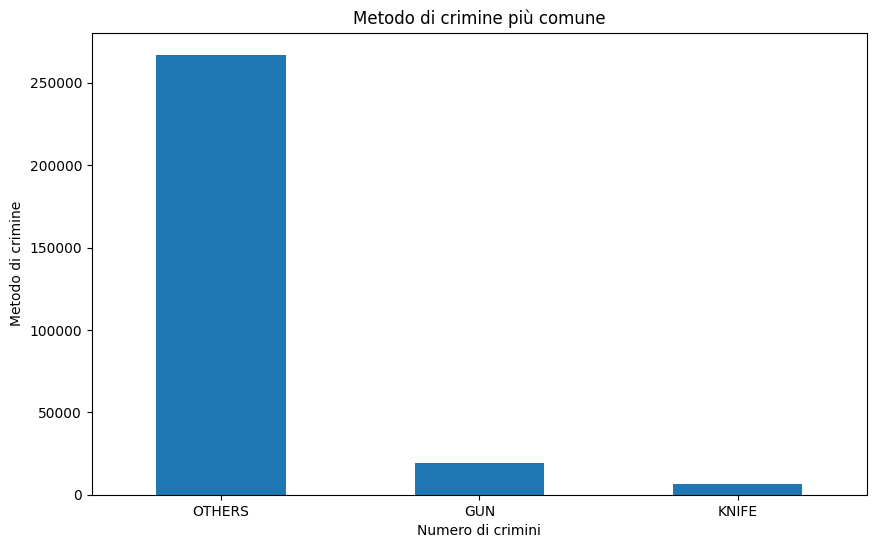

In [ ]:
method_counts = df['METHOD'].value_counts()

plt.figure(figsize=(10, 6))
method_counts.plot(kind='bar')
plt.title('Metodo di crimine più comune')
plt.xlabel('Numero di crimini')
plt.ylabel('Metodo di crimine')
plt.xticks(rotation=0)
plt.show()

In [ ]:
df = df.dropna(subset=['LATITUDE', 'LONGITUDE'])


sampled_df = df.sample(n=10000, random_state=42)


m = folium.Map(location=[38.9072, -77.0369], zoom_start=12)

heat_data = [[row['LATITUDE'], row['LONGITUDE']] for index, row in sampled_df.iterrows()]

HeatMap(heat_data).add_to(m)

m

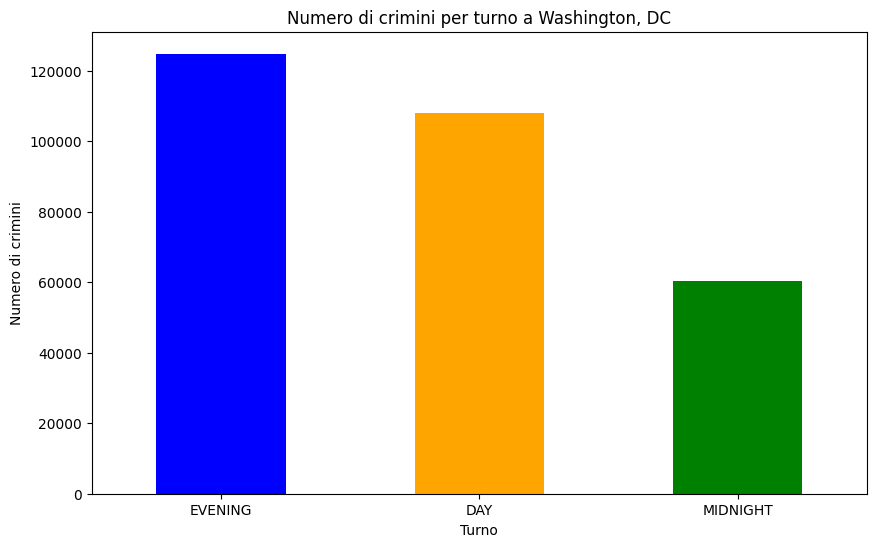

In [ ]:
shift_counts = df['SHIFT'].value_counts()

plt.figure(figsize=(10, 6))

shift_counts.plot(kind='bar', color=['blue', 'orange', 'green'])

plt.title('Numero di crimini per turno a Washington, DC')
plt.xlabel('Turno')
plt.ylabel('Numero di crimini')
plt.xticks(rotation=0)
plt.show()

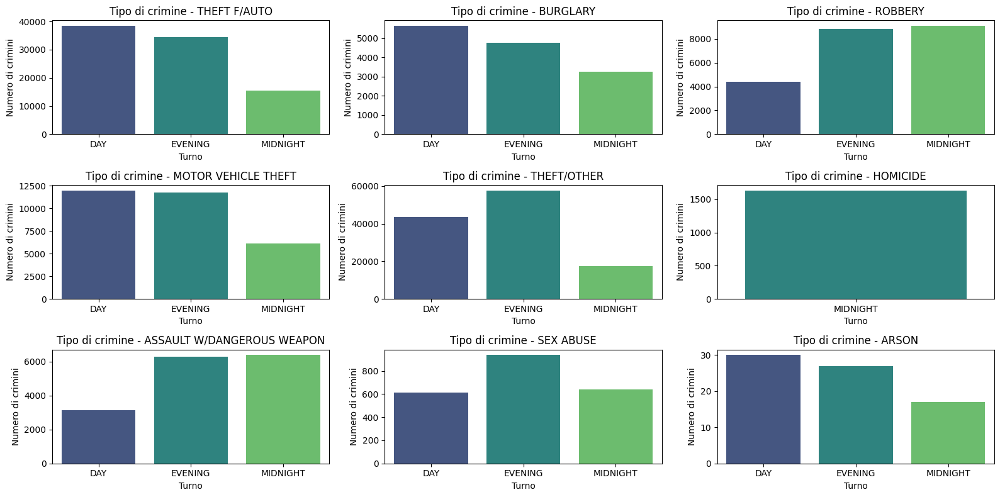

In [ ]:
crime_methods = df['OFFENSE'].unique()

n_rows = 3
n_cols = (len(crime_methods) + 1) // n_rows

fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 8))

axes = axes.flatten()

for i, method in enumerate(crime_methods):
    method_df = df[df['OFFENSE'] == method]

    shift_counts = method_df['SHIFT'].value_counts().sort_index().reset_index()
    shift_counts.columns = ['SHIFT', 'COUNT']

    sns.barplot(data=shift_counts, x='SHIFT', y='COUNT', ax=axes[i], palette='viridis', hue='SHIFT', dodge=False, legend=False)

    axes[i].set_title(f'Tipo di crimine - {method}')
    axes[i].set_xlabel('Turno')
    axes[i].set_ylabel('Numero di crimini')

for i in range(len(crime_methods), n_rows * n_cols):
    fig.delaxes(axes[i])

plt.tight_layout()

plt.show()




#grafici dei diversi tipi di crimine: sulle ascisse i diversi periodi del giorno (giorno, sera, notte); 
#sulle ordinate il numero dei crimini registrati

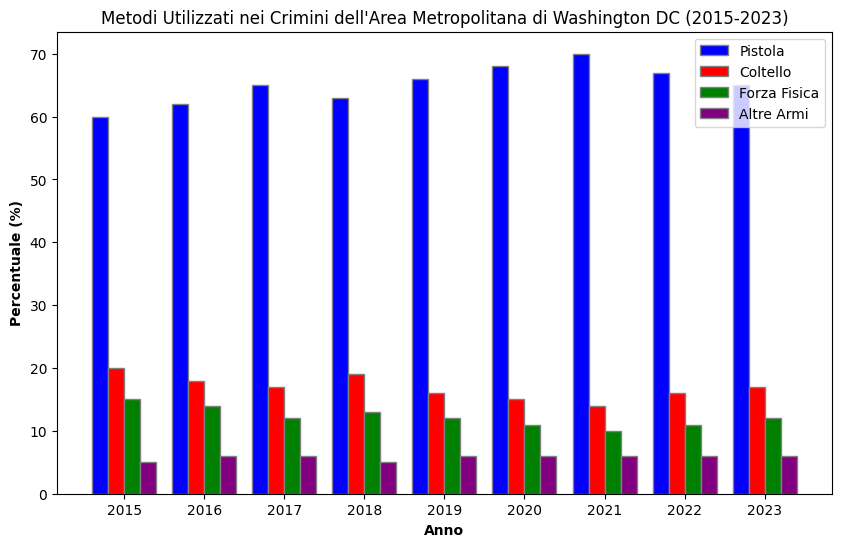

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Anni dal 2015 al 2023
anni = np.arange(2015, 2024)

# Dati sulle percentuali di utilizzo di vari metodi nei crimini per ogni anno
pistola = [60, 62, 65, 63, 66, 68, 70, 67, 65]
coltello = [20, 18, 17, 19, 16, 15, 14, 16, 17]
forza_fisica = [15, 14, 12, 13, 12, 11, 10, 11, 12]
altre_armi = [5, 6, 6, 5, 6, 6, 6, 6, 6]

# Creazione della figura e degli assi per il grafico
fig, ax = plt.subplots(figsize=(10, 6))

# Larghezza delle barre nel grafico
bar_width = 0.2

# Posizioni delle barre sul grafico
r1 = np.arange(len(anni))
r2 = [x + bar_width for x in r1]
r3 = [x + bar_width for x in r2]
r4 = [x + bar_width for x in r3]

# Creazione delle barre per ogni metodo
plt.bar(r1, pistola, color='blue', width=bar_width, edgecolor='grey', label='Pistola')
plt.bar(r2, coltello, color='red', width=bar_width, edgecolor='grey', label='Coltello')
plt.bar(r3, forza_fisica, color='green', width=bar_width, edgecolor='grey', label='Forza Fisica')
plt.bar(r4, altre_armi, color='purple', width=bar_width, edgecolor='grey', label='Altre Armi')

# Etichetta dell'asse x
plt.xlabel('Anno', fontweight='bold')

# Etichetta dell'asse y
plt.ylabel('Percentuale (%)', fontweight='bold')

# Titolo
plt.title('Metodi Utilizzati nei Crimini dell\'Area Metropolitana di Washington DC (2015-2023)')

# Posizione delle etichette sull'asse x
plt.xticks([r + 1.5 * bar_width for r in range(len(anni))], anni)

# Aggiunta della legenda per identificare i vari metodi
plt.legend()

# Visualizzazione del grafico
plt.show()


la maggior parte dei crimini sono stati effettuati con l'utilizzo di armi da fuoco, seguiti dai crimini effettuati con coltello 

In [ ]:
df['REPORT_DAT'] = pd.to_datetime(df['REPORT_DAT'])

crime_type = "HOMICIDE"
filtered_df = df[df['OFFENSE'] == crime_type]

filtered_df = filtered_df.dropna(subset=['LATITUDE', 'LONGITUDE'])

sampled_df = filtered_df.sample(n=1000, random_state=42)

# Crea una mappa centrata su Washington, DC
m = folium.Map(location=[38.9072, -77.0369], zoom_start=12)

heat_data = [[row['LATITUDE'], row['LONGITUDE']] for index, row in sampled_df.iterrows()]

HeatMap(heat_data).add_to(m)
m

In [ ]:
df = df[['LATITUDE', 'LONGITUDE', 'OFFENSE']]

df = df.dropna(subset=['LATITUDE', 'LONGITUDE'])

m = folium.Map(location=[38.89511, -77.03637], zoom_start=12)

marker_cluster = MarkerCluster().add_to(m)
sampled_df = df.sample(n=5000, random_state=42)

for idx, row in sampled_df.iterrows():
    folium.Marker(
        location=[row['LATITUDE'], row['LONGITUDE']],
        popup=row['OFFENSE'],
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(marker_cluster)

m

la maggior parte dei crimini sono stati effettuati tra Columbia Heights e Dupont Circle: ben 1635 (quasi il doppio del secondo numero più alto, cioè 935 tra Langston e Capitol Hill)

In [ ]:
df = df[['LATITUDE', 'LONGITUDE', 'OFFENSE']]

df = df.dropna(subset=['LATITUDE', 'LONGITUDE'])

m = folium.Map(location=[38.89511, -77.03637], zoom_start=12)

marker_cluster = MarkerCluster().add_to(m)

sampled_df = df.sample(n=1000, random_state=42)

colors = ['blue', 'green', 'red', 'purple', 'orange', 'darkred', 'lightred', 
          'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']

offense_types = sampled_df['OFFENSE'].unique()
color_map = {offense: random.choice(colors) for offense in offense_types}

for idx, row in sampled_df.iterrows():
    folium.Marker(
        location=[row['LATITUDE'], row['LONGITUDE']],
        popup=row['OFFENSE'],
        icon=folium.Icon(color=color_map[row['OFFENSE']], icon='info-sign')
    ).add_to(marker_cluster)

m

In [ ]:
geojson_path = 'DC_Health_Planning_Neighborhoods.geojson'

m = folium.Map(location=[38.89511, -77.03637], zoom_start=12)

folium.GeoJson(
    geojson_path,
    name='geojson'
).add_to(m)

folium.GeoJson(
    geojson_path,
    name='labels',
    style_function=lambda feature: {
        'fillOpacity': 0,
        'weight': 0
    },
    tooltip=folium.features.GeoJsonTooltip(fields=['NAME'], aliases=['Neighborhood:'])
).add_to(m)

folium.LayerControl().add_to(m)

df = df.dropna(subset=['LATITUDE', 'LONGITUDE'])

sampled_df = df.sample(n=1000, random_state=42)

heat_data = [[row['LATITUDE'], row['LONGITUDE']] for index, row in sampled_df.iterrows()]

HeatMap(heat_data).add_to(m)
m

/tmp/ipykernel_58/1523280907.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=df['WARD'],palette=palette)
/tmp/ipykernel_58/1523280907.py:6: UserWarning: 
The palette list has fewer values (6) than needed (8) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(data=df, x=df['WARD'],palette=palette)


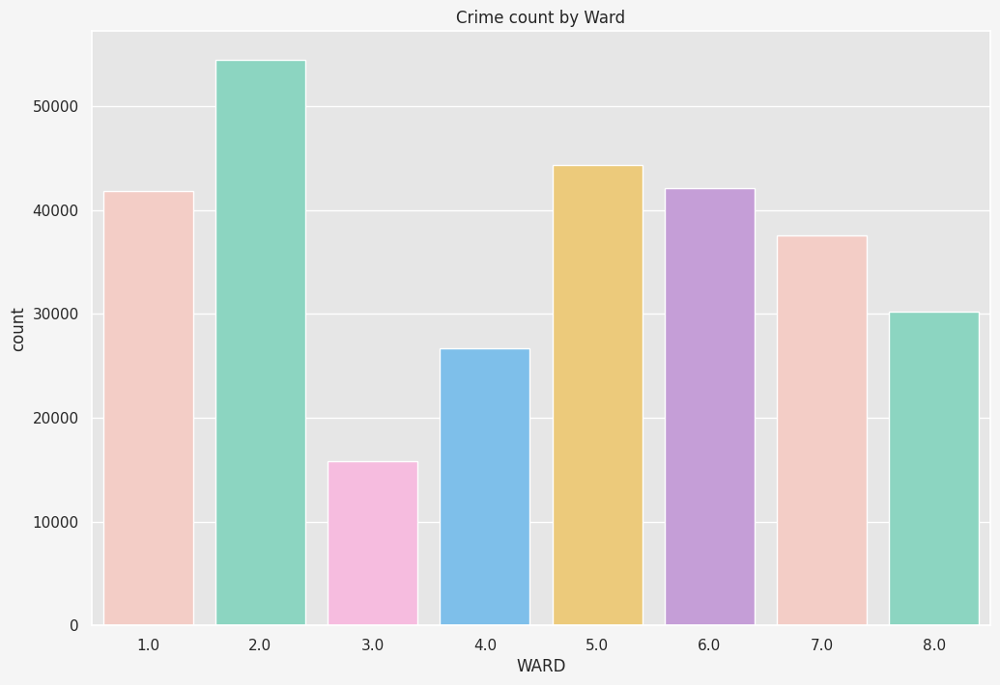

In [ ]:
palette = ["#FAC8BE", "#80E1C6", "#FFB3E1", "#6CC3FC", "#FFD168", "#C894E1"]
sns.set(rc={"axes.facecolor":"#e6e6e6","figure.facecolor":"#f5f5f5"})

df = pd.read_csv("./DC_Crime_Data.csv")
plt.figure(figsize=(12, 8))
sns.countplot(data=df, x=df['WARD'],palette=palette)
plt.title("Crime count by Ward")
plt.show()

/tmp/ipykernel_58/493106121.py:6: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  weekly_counts = df['START_DATE'].dt.to_period('W').value_counts().sort_index()
/tmp/ipykernel_58/493106121.py:7: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  monthly_counts = df['START_DATE'].dt.to_period('M').value_counts().sort_index()


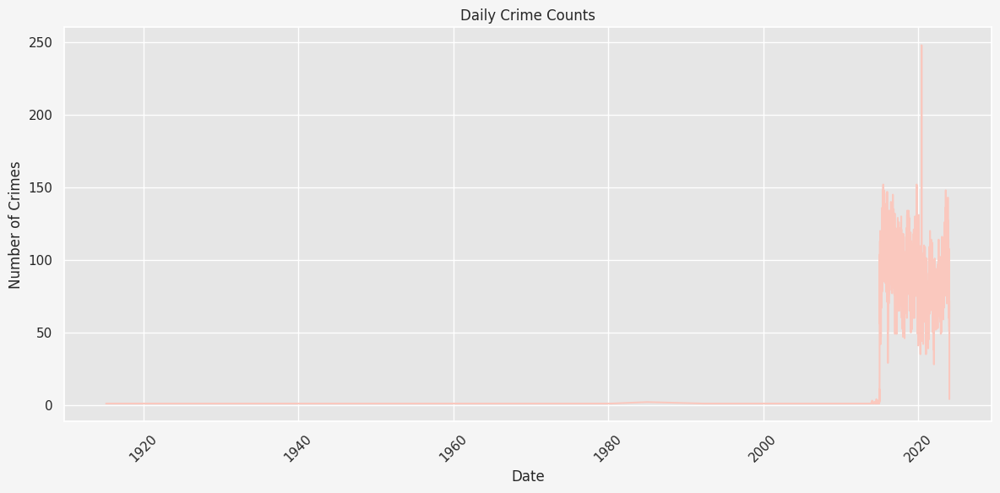

In [ ]:
df = pd.read_csv("./DC_Crime_Data.csv")
df['START_DATE'] = pd.to_datetime(df['START_DATE'])
df['END_DATE'] = pd.to_datetime(df['END_DATE'])

daily_counts = df['START_DATE'].dt.date.value_counts().sort_index()
weekly_counts = df['START_DATE'].dt.to_period('W').value_counts().sort_index()
monthly_counts = df['START_DATE'].dt.to_period('M').value_counts().sort_index()

# Daily
plt.figure(figsize=(12,6))
sns.lineplot(x=daily_counts.index, y=daily_counts.values, color = palette[0])
plt.title('Daily Crime Counts')
plt.xlabel('Date')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=45) 
plt.tight_layout() 
plt.show()

/tmp/ipykernel_58/663246811.py:60: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=crime_by_neighborhood.values, y=crime_by_neighborhood.index, palette='viridis')


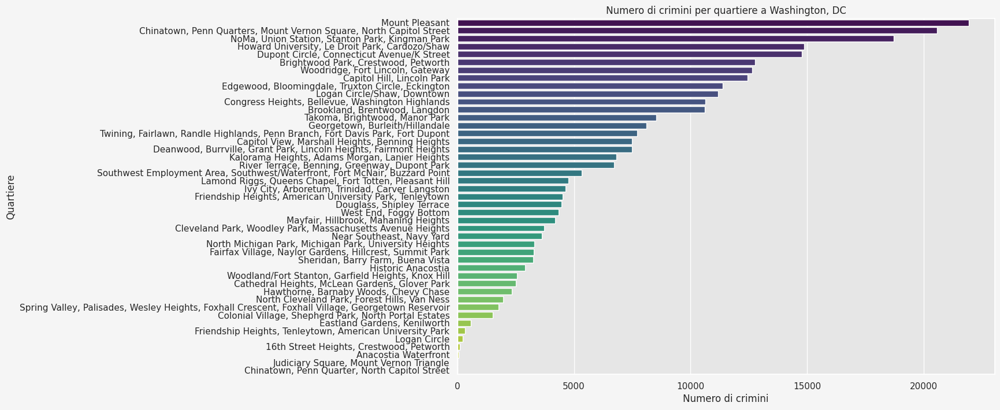

In [ ]:

df = pd.read_csv("./DC_Crime_Data.csv")

cluster_map = {
    "Cluster 1": "Kalorama Heights, Adams Morgan, Lanier Heights",
    "Cluster 2": "Mount Pleasant",
    "Cluster 3": "Howard University, Le Droit Park, Cardozo/Shaw",
    "Cluster 4": "Georgetown, Burleith/Hillandale",
    "Cluster 5": "West End, Foggy Bottom",
    "Cluster 6": "Dupont Circle, Connecticut Avenue/K Street",
    "Cluster 7": "Logan Circle/Shaw, Downtown",
    "Cluster 8": "Chinatown, Penn Quarters, Mount Vernon Square, North Capitol Street",
    "Cluster 9": "Southwest Employment Area, Southwest/Waterfront, Fort McNair, Buzzard Point",
    "Cluster 10": "Hawthorne, Barnaby Woods, Chevy Chase",
    "Cluster 11": "Friendship Heights, American University Park, Tenleytown",
    "Cluster 12": "North Cleveland Park, Forest Hills, Van Ness",
    "Cluster 13": "Spring Valley, Palisades, Wesley Heights, Foxhall Crescent, Foxhall Village, Georgetown Reservoir",
    "Cluster 14": "Cathedral Heights, McLean Gardens, Glover Park",
    "Cluster 15": "Cleveland Park, Woodley Park, Massachusetts Avenue Heights",
    "Cluster 16": "Colonial Village, Shepherd Park, North Portal Estates",
    "Cluster 17": "Takoma, Brightwood, Manor Park",
    "Cluster 18": "Brightwood Park, Crestwood, Petworth",
    "Cluster 19": "Lamond Riggs, Queens Chapel, Fort Totten, Pleasant Hill",
    "Cluster 20": "North Michigan Park, Michigan Park, University Heights",
    "Cluster 21": "Edgewood, Bloomingdale, Truxton Circle, Eckington",
    "Cluster 22": "Brookland, Brentwood, Langdon",
    "Cluster 23": "Woodridge, Fort Lincoln, Gateway",
    "Cluster 24": "Ivy City, Arboretum, Trinidad, Carver Langston",
    "Cluster 25": "NoMa, Union Station, Stanton Park, Kingman Park",
    "Cluster 26": "Capitol Hill, Lincoln Park",
    "Cluster 27": "Near Southeast, Navy Yard",
    "Cluster 28": "Historic Anacostia",
    "Cluster 29": "Eastland Gardens, Kenilworth",
    "Cluster 30": "Mayfair, Hillbrook, Mahaning Heights",
    "Cluster 31": "Deanwood, Burrville, Grant Park, Lincoln Heights, Fairmont Heights",
    "Cluster 32": "River Terrace, Benning, Greenway, Dupont Park",
    "Cluster 33": "Capitol View, Marshall Heights, Benning Heights",
    "Cluster 34": "Twining, Fairlawn, Randle Highlands, Penn Branch, Fort Davis Park, Fort Dupont",
    "Cluster 35": "Fairfax Village, Naylor Gardens, Hillcrest, Summit Park",
    "Cluster 36": "Woodland/Fort Stanton, Garfield Heights, Knox Hill",
    "Cluster 37": "Sheridan, Barry Farm, Buena Vista",
    "Cluster 38": "Douglass, Shipley Terrace",
    "Cluster 39": "Congress Heights, Bellevue, Washington Highlands",
    "Cluster 40": "Anacostia Waterfront",
    "Cluster 41": "Judiciary Square, Mount Vernon Triangle",
    "Cluster 42": "Chinatown, Penn Quarter, North Capitol Street",
    "Cluster 43": "Logan Circle",
    "Cluster 44": "16th Street Heights, Crestwood, Petworth",
    "Cluster 45": "Friendship Heights, Tenleytown, American University Park",
    "Cluster 46": "Sheridan, Barry Farm, Buena Vista"
}

df['NEIGHBORHOOD_NAME'] = df['NEIGHBORHOOD_CLUSTER'].map(cluster_map)

crime_by_neighborhood = df['NEIGHBORHOOD_NAME'].value_counts()

plt.figure(figsize=(12, 8))

sns.barplot(x=crime_by_neighborhood.values, y=crime_by_neighborhood.index, palette='viridis')

plt.title('Numero di crimini per quartiere a Washington, DC')
plt.xlabel('Numero di crimini')
plt.ylabel('Quartiere')

plt.show()

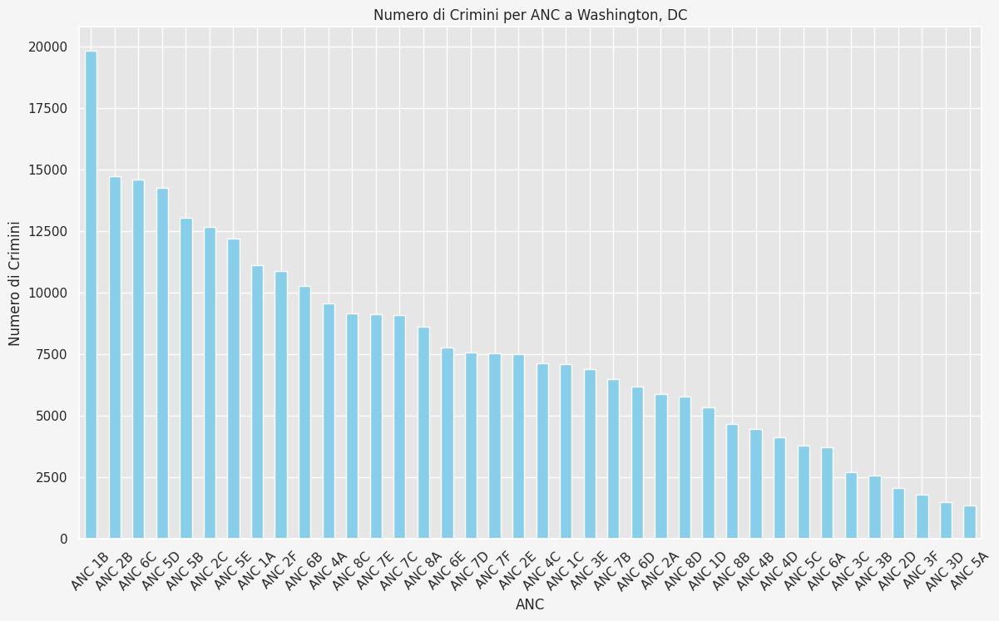

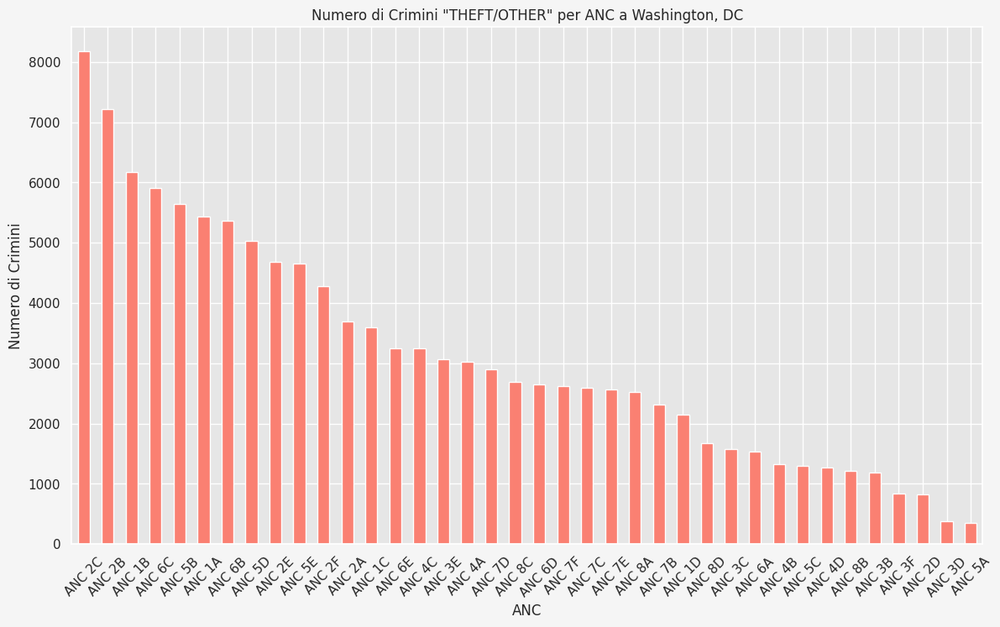

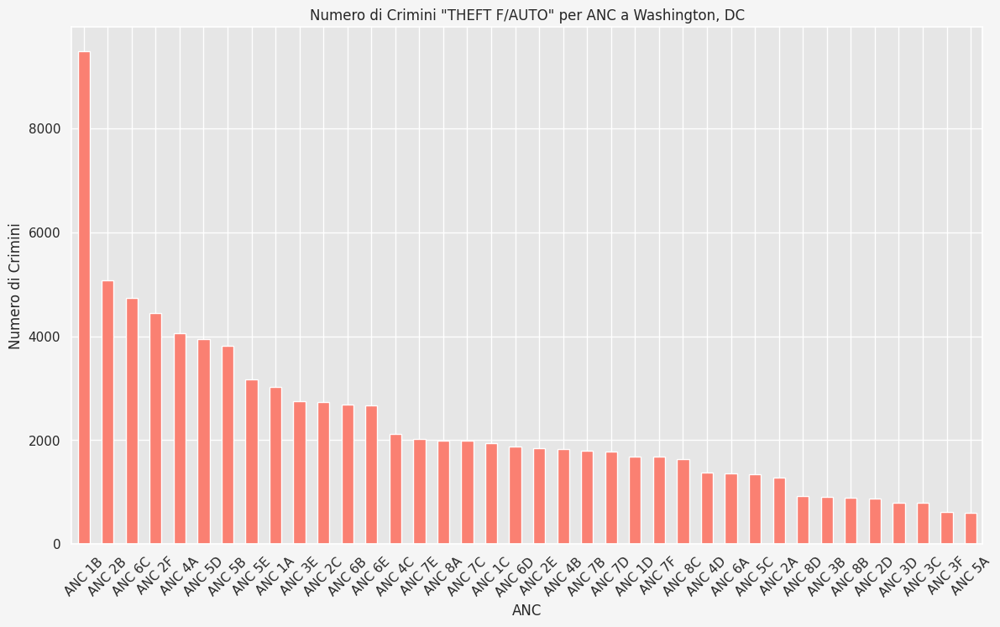

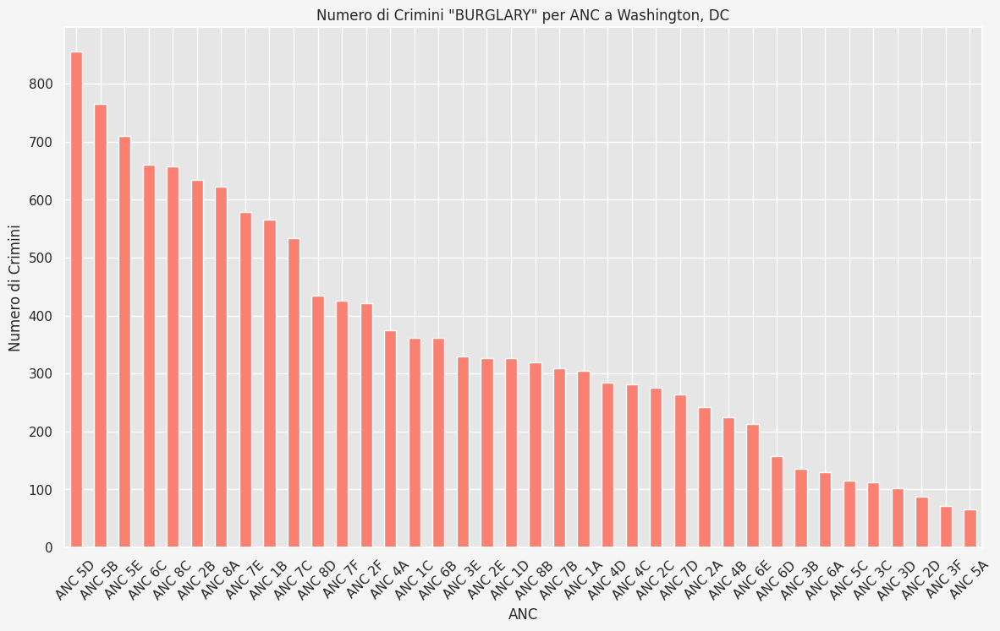

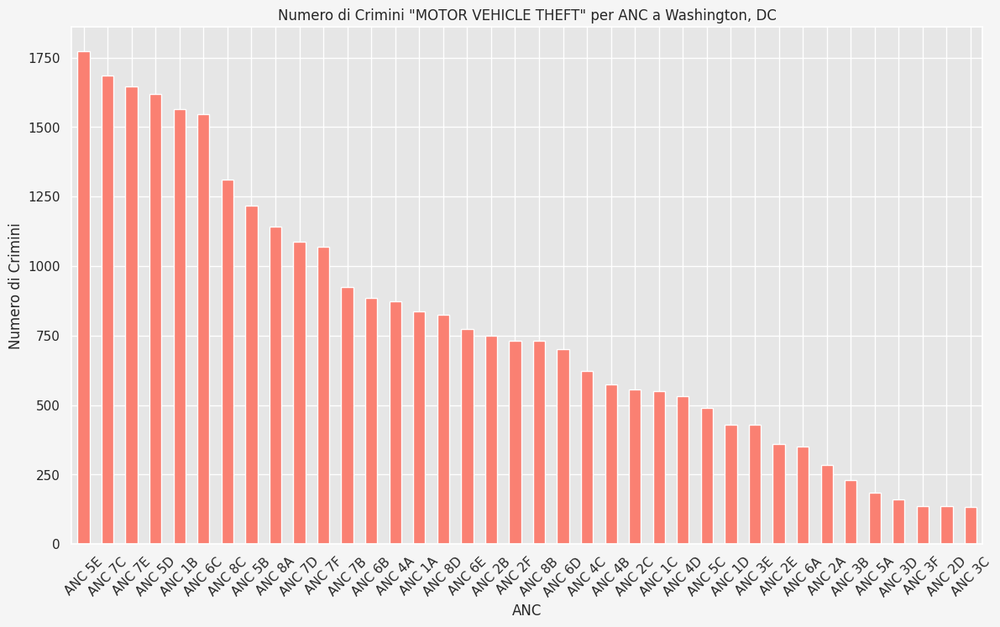

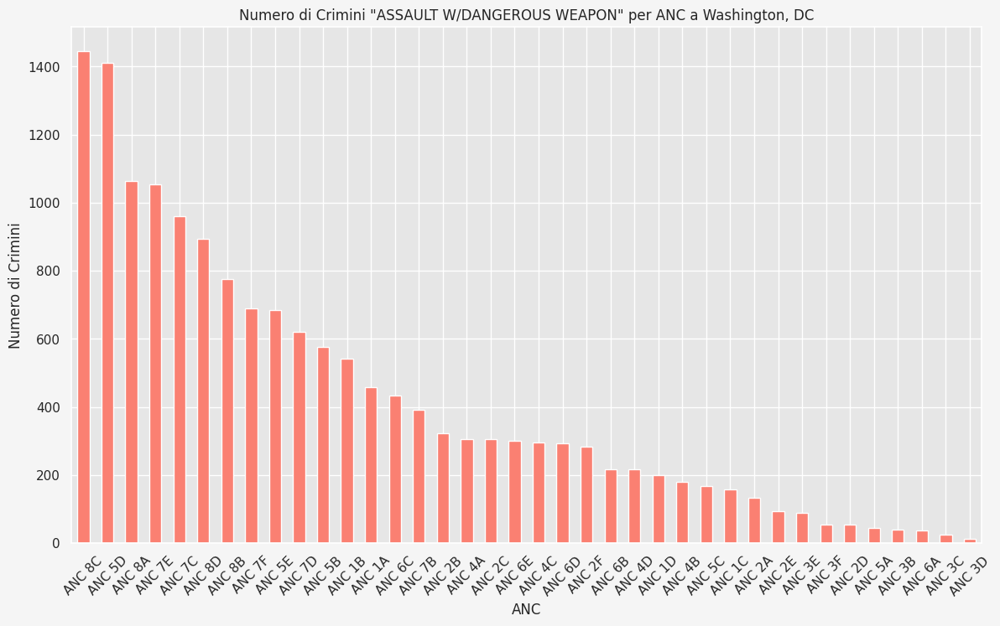

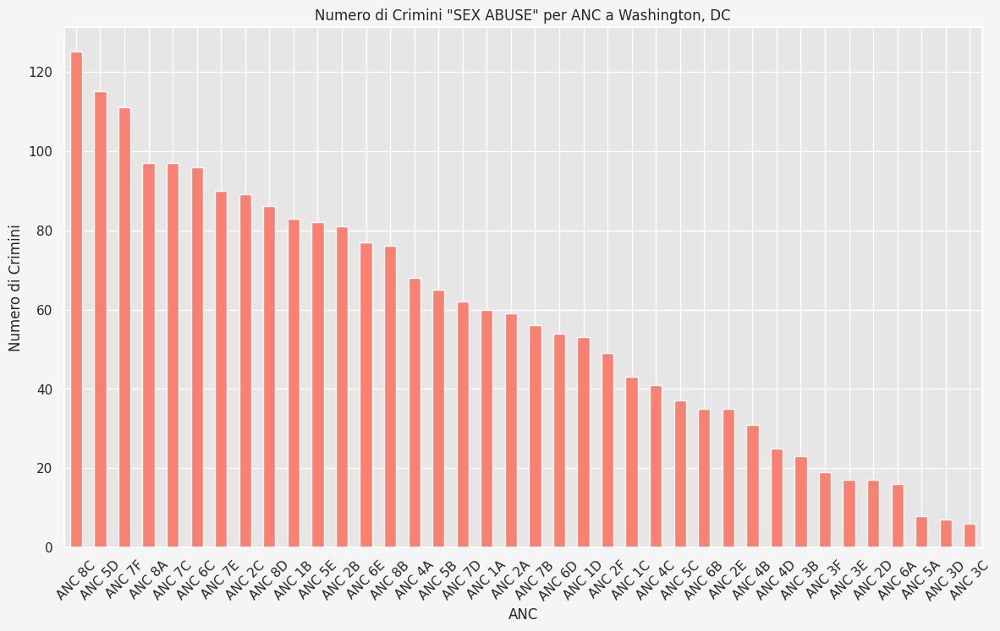

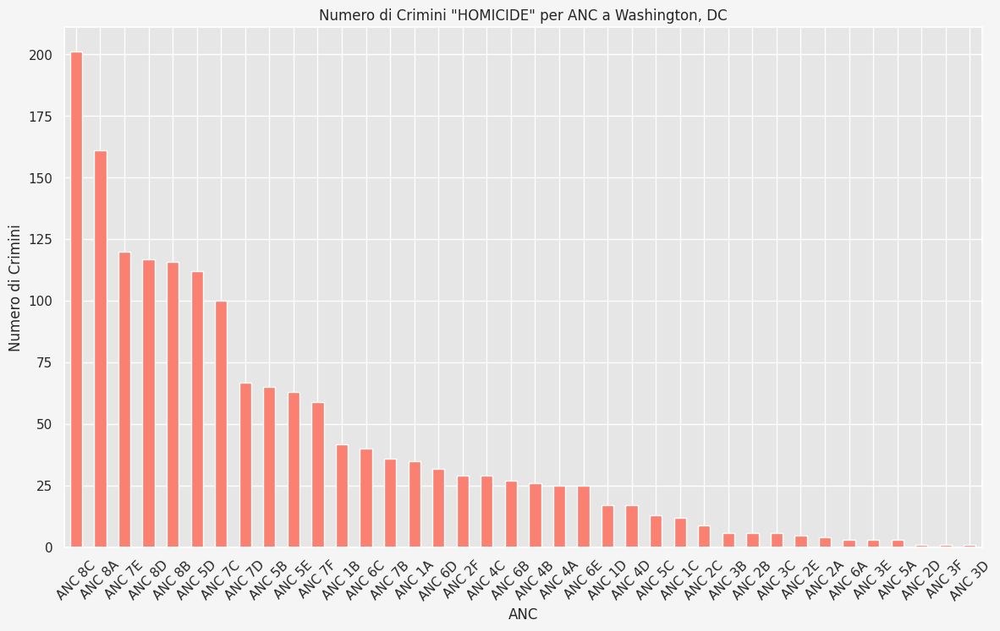

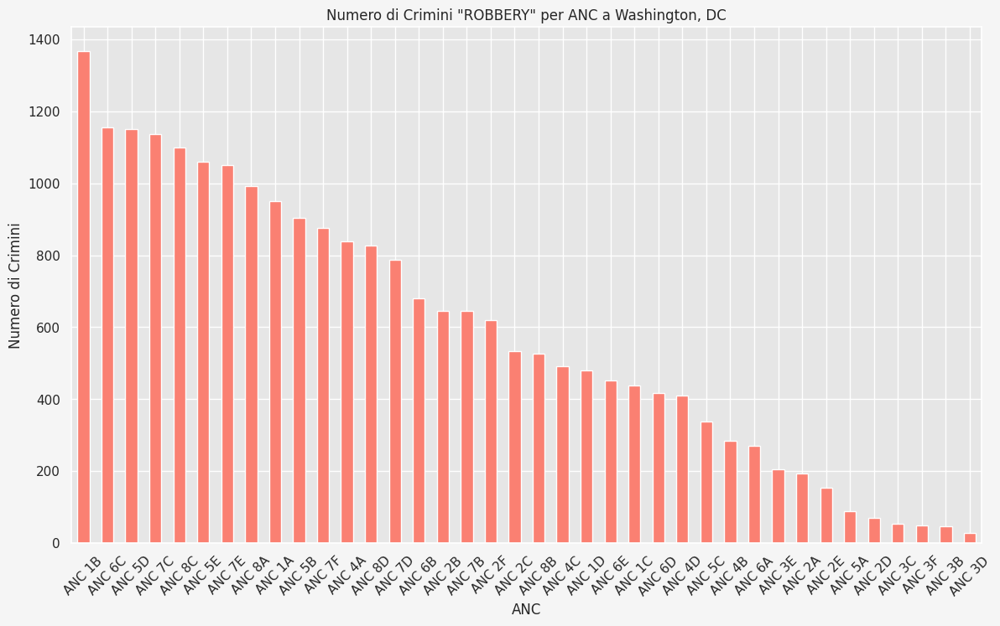

In [ ]:
from scipy.spatial import KDTree

anc_coordinates = {
    "Ward 1": {
        "ANC 1A": {"neighborhood": "Columbia Heights", "latitude": 38.9286, "longitude": -77.0337},
        "ANC 1B": {"neighborhood": "U Street, LeDroit Park, Cardozo/Shaw", "latitude": 38.9209, "longitude": -77.0240},
        "ANC 1C": {"neighborhood": "Adams Morgan", "latitude": 38.9213, "longitude": -77.0434},
        "ANC 1D": {"neighborhood": "Mount Pleasant", "latitude": 38.9317, "longitude": -77.0374}
    },
    "Ward 2": {
        "ANC 2A": {"neighborhood": "Foggy Bottom/West End", "latitude": 38.9006, "longitude": -77.0512},
        "ANC 2B": {"neighborhood": "Dupont Circle", "latitude": 38.9117, "longitude": -77.0433},
        "ANC 2C": {"neighborhood": "Downtown/Penn Quarter", "latitude": 38.8967, "longitude": -77.0261},
        "ANC 2D": {"neighborhood": "Sheridan/Kalorama", "latitude": 38.9134, "longitude": -77.0490},
        "ANC 2E": {"neighborhood": "Georgetown, Burleith/Hillandale", "latitude": 38.9101, "longitude": -77.0652},
        "ANC 2F": {"neighborhood": "Logan Circle/Shaw", "latitude": 38.9072, "longitude": -77.0211}
    },
    "Ward 3": {
        "ANC 3B": {"neighborhood": "Glover Park, Cathedral Heights", "latitude": 38.9261, "longitude": -77.0788},
        "ANC 3C": {"neighborhood": "Cleveland Park, Massachusetts Avenue Heights, Woodley Park", "latitude": 38.9387, "longitude": -77.0641},
        "ANC 3D": {"neighborhood": "Palisades, Wesley Heights, Foxhall, Foxhall Crescent, Spring Valley", "latitude": 38.9344, "longitude": -77.0980},
        "ANC 3E": {"neighborhood": "American University Park, Friendship Heights, Tenleytown", "latitude": 38.9507, "longitude": -77.0782},
        "ANC 3F": {"neighborhood": "North Cleveland Park, Forest Hills, Van Ness", "latitude": 38.9406, "longitude": -77.0631}
    },
    "Ward 4": {
        "ANC 4A": {"neighborhood": "Colonial Village, Shepherd Park, North Portal Estates", "latitude": 38.9664, "longitude": -77.0260},
        "ANC 4B": {"neighborhood": "Brightwood, Fort Totten, Manor Park, Lamond Riggs, Takoma", "latitude": 38.9614, "longitude": -77.0160},
        "ANC 4C": {"neighborhood": "Crestwood, Petworth, 16th Street Heights", "latitude": 38.9424, "longitude": -77.0248},
        "ANC 4D": {"neighborhood": "Brightwood Park, South Petworth", "latitude": 38.9459, "longitude": -77.0261}
    },
    "Ward 5": {
        "ANC 5A": {"neighborhood": "North Michigan Park, University Heights, Catholic University", "latitude": 38.9519, "longitude": -76.9903},
        "ANC 5B": {"neighborhood": "Brookland, Edgewood, Catholic University", "latitude": 38.9335, "longitude": -76.9885},
        "ANC 5C": {"neighborhood": "Fort Totten, Pleasant Hill, Lamond Riggs, Queens Chapel", "latitude": 38.9539, "longitude": -76.9978},
        "ANC 5D": {"neighborhood": "Ivy City, Trinidad, Arboretum, Carver Langston", "latitude": 38.9072, "longitude": -76.9773},
        "ANC 5E": {"neighborhood": "Bloomingdale, Eckington, Truxton Circle", "latitude": 38.9140, "longitude": -77.0101}
    },
    "Ward 6": {
        "ANC 6A": {"neighborhood": "Capitol Hill East, Hill East", "latitude": 38.8892, "longitude": -76.9960},
        "ANC 6B": {"neighborhood": "Capitol Hill South", "latitude": 38.8870, "longitude": -76.9970},
        "ANC 6C": {"neighborhood": "Near Northeast, Union Station, Stanton Park", "latitude": 38.8990, "longitude": -76.9940},
        "ANC 6D": {"neighborhood": "Southwest Waterfront, Navy Yard, Buzzard Point", "latitude": 38.8801, "longitude": -77.0201},
        "ANC 6E": {"neighborhood": "Shaw, Mount Vernon Square, NoMa", "latitude": 38.9055, "longitude": -77.0163}
    },
    "Ward 7": {
        "ANC 7B": {"neighborhood": "Hillcrest, Fairfax Village, Naylor Gardens, Summit Park", "latitude": 38.8650, "longitude": -76.9560},
        "ANC 7C": {"neighborhood": "Deanwood, Burrville, Grant Park, Lincoln Heights, Fairmont Heights", "latitude": 38.8992, "longitude": -76.9327},
        "ANC 7D": {"neighborhood": "Eastland Gardens, Kenilworth, Parkside, Mayfair, Paradise", "latitude": 38.9084, "longitude": -76.9457},
        "ANC 7E": {"neighborhood": "Benning Ridge, Capitol View, Marshall Heights, Benning Heights", "latitude": 38.8835, "longitude": -76.9340},
        "ANC 7F": {"neighborhood": "Kingman Park, Rosedale, River Terrace", "latitude": 38.8903, "longitude": -76.9711}
    },
    "Ward 8": {
        "ANC 8A": {"neighborhood": "Historic Anacostia, Anacostia Waterfront", "latitude": 38.8628, "longitude": -76.9853},
        "ANC 8B": {"neighborhood": "Douglass, Shipley Terrace, Woodland/Fort Stanton, Knox Hill", "latitude": 38.8548, "longitude": -76.9801},
        "ANC 8C": {"neighborhood": "Congress Heights, Bellevue, Washington Highlands", "latitude": 38.8404, "longitude": -77.0078},
        "ANC 8D": {"neighborhood": "Buena Vista, Garfield Heights, Sheridan, Barry Farm", "latitude": 38.8482, "longitude": -76.9835}
    }
}
anc_list = []
for ward, ancs in anc_coordinates.items():
    for anc, data in ancs.items():
        anc_list.append([ward, anc, data['neighborhood'], data['latitude'], data['longitude']])
        
anc_df = pd.DataFrame(anc_list, columns=['Ward', 'ANC', 'Neighborhood', 'Latitude', 'Longitude'])

anc_tree = KDTree(anc_df[['Latitude', 'Longitude']])

def find_nearest_anc(crime_lat, crime_lon):
    dist, index = anc_tree.query([crime_lat, crime_lon])
    return anc_df.iloc[index]['ANC']

df['ANC'] = df.apply(lambda row: find_nearest_anc(row['LATITUDE'], row['LONGITUDE']), axis=1)

crime_counts_by_anc = df['ANC'].value_counts()

plt.figure(figsize=(14, 8))
crime_counts_by_anc.plot(kind='bar', color='skyblue')
plt.title('Numero di Crimini per ANC a Washington, DC')
plt.xlabel('ANC')
plt.ylabel('Numero di Crimini')
plt.xticks(rotation=45)
plt.show()

theft_other_counts_by_anc = df[df['OFFENSE'] == 'THEFT/OTHER']['ANC'].value_counts()

plt.figure(figsize=(14, 8))
theft_other_counts_by_anc.plot(kind='bar', color='salmon')
plt.title('Numero di Crimini "THEFT/OTHER" per ANC a Washington, DC')
plt.xlabel('ANC')
plt.ylabel('Numero di Crimini')
plt.xticks(rotation=45)
plt.show()

theft_other_counts_by_anc = df[df['OFFENSE'] == 'THEFT F/AUTO']['ANC'].value_counts()

plt.figure(figsize=(14, 8))
theft_other_counts_by_anc.plot(kind='bar', color='salmon')
plt.title('Numero di Crimini "THEFT F/AUTO" per ANC a Washington, DC')
plt.xlabel('ANC')
plt.ylabel('Numero di Crimini')
plt.xticks(rotation=45)
plt.show()

theft_other_counts_by_anc = df[df['OFFENSE'] == 'BURGLARY']['ANC'].value_counts()

plt.figure(figsize=(14, 8))
theft_other_counts_by_anc.plot(kind='bar', color='salmon')
plt.title('Numero di Crimini "BURGLARY" per ANC a Washington, DC')
plt.xlabel('ANC')
plt.ylabel('Numero di Crimini')
plt.xticks(rotation=45)
plt.show()

theft_other_counts_by_anc = df[df['OFFENSE'] == 'MOTOR VEHICLE THEFT']['ANC'].value_counts()

plt.figure(figsize=(14, 8))
theft_other_counts_by_anc.plot(kind='bar', color='salmon')
plt.title('Numero di Crimini "MOTOR VEHICLE THEFT" per ANC a Washington, DC')
plt.xlabel('ANC')
plt.ylabel('Numero di Crimini')
plt.xticks(rotation=45)
plt.show()

theft_other_counts_by_anc = df[df['OFFENSE'] == 'ASSAULT W/DANGEROUS WEAPON']['ANC'].value_counts()

plt.figure(figsize=(14, 8))
theft_other_counts_by_anc.plot(kind='bar', color='salmon')
plt.title('Numero di Crimini "ASSAULT W/DANGEROUS WEAPON" per ANC a Washington, DC')
plt.xlabel('ANC')
plt.ylabel('Numero di Crimini')
plt.xticks(rotation=45)
plt.show()

theft_other_counts_by_anc = df[df['OFFENSE'] == 'SEX ABUSE']['ANC'].value_counts()

plt.figure(figsize=(14, 8))
theft_other_counts_by_anc.plot(kind='bar', color='salmon')
plt.title('Numero di Crimini "SEX ABUSE" per ANC a Washington, DC')
plt.xlabel('ANC')
plt.ylabel('Numero di Crimini')
plt.xticks(rotation=45)
plt.show()

theft_other_counts_by_anc = df[df['OFFENSE'] == 'HOMICIDE']['ANC'].value_counts()

plt.figure(figsize=(14, 8))
theft_other_counts_by_anc.plot(kind='bar', color='salmon')
plt.title('Numero di Crimini "HOMICIDE" per ANC a Washington, DC')
plt.xlabel('ANC')
plt.ylabel('Numero di Crimini')
plt.xticks(rotation=45)
plt.show()

theft_other_counts_by_anc = df[df['OFFENSE'] == 'ROBBERY']['ANC'].value_counts()

plt.figure(figsize=(14, 8))
theft_other_counts_by_anc.plot(kind='bar', color='salmon')
plt.title('Numero di Crimini "ROBBERY" per ANC a Washington, DC')
plt.xlabel('ANC')
plt.ylabel('Numero di Crimini')
plt.xticks(rotation=45)
plt.show()

L'ANC 8C, che comprende i quartieri di Bellevue, Congress Heights e Washington Highlands, è caratterizzato da un reddito medio inferiore rispetto ad altre parti di Washington, D.C. La povertà è una questione critica, con molte famiglie che lottano per soddisfare le esigenze di base.
La disoccupazione è relativamente alta, con molte persone che trovano difficoltà a trovare lavori stabili e ben retribuiti. Questo può essere attribuito in parte alla mancanza di opportunità economiche nella zona.
La zona ha una grande quantità di abitazioni a basso reddito e alloggi pubblici. Ciò riflette le sfide economiche affrontate dai residenti, con molti che vivono in condizioni di precarietà abitativa.
Questi fattori risultano confermati nei grafici sopra visto che l'ANC 8C appare essere l'ANC col maggior numero di crimini per ben 3 diversi tipi di crimini: omicidi, aggressioni e stupri; tutti crimini violenti.
Inoltre l'ANC 8C è il quinto ANC per numero di rapine e questo conferma il quadro che si è delineato su questa zona.
Questo contribuisce a un senso di insicurezza tra i residenti.
La presenza di attività legate al traffico di droga è significativa, alimentando ulteriormente la violenza e la criminalità nell'area.

Le difficoltà economiche e la mancanza di opportunità di lavoro contribuiscono in modo significativo ai tassi elevati di criminalità. La lotta per la sopravvivenza in un ambiente economico difficile può portare alcuni individui verso attività criminali.
Le condizioni di vita precarie possono contribuire alla criminalità, con aree ad alta densità abitativa che spesso diventano punti critici per l'attività criminale.
La mancanza di accesso a servizi essenziali come l'istruzione e la sanità può creare un ambiente in cui la criminalità prospera. I giovani senza opportunità educative adeguate possono essere più vulnerabili al coinvolgimento in attività criminali.

Ci sono sforzi per rafforzare la polizia comunitaria e migliorare le relazioni tra le forze dell'ordine e i residenti. Questo può aiutare a ridurre la criminalità e costruire fiducia nella comunità.
Diversi programmi di prevenzione della violenza sono attivi nella zona, mirati a ridurre la criminalità attraverso l'educazione, il supporto ai giovani e l'intervento nelle situazioni di rischio.

/tmp/ipykernel_58/2098796209.py:8: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  weekly_counts = df['START_DATE'].dt.to_period('W').value_counts().sort_index()
/tmp/ipykernel_58/2098796209.py:9: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  monthly_counts = df['START_DATE'].dt.to_period('M').value_counts().sort_index()


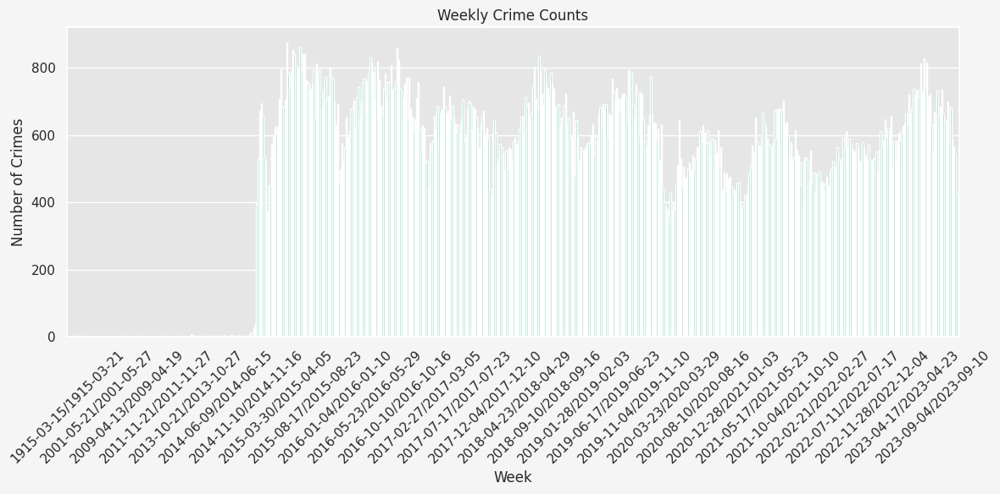

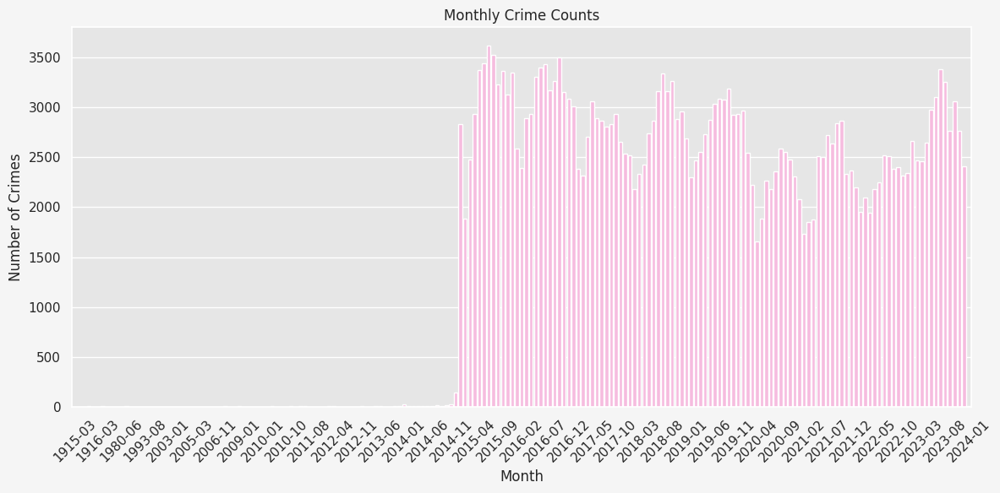

In [ ]:
df = pd.read_csv("./DC_Crime_Data.csv")
df['START_DATE'] = pd.to_datetime(df['START_DATE'])
df['END_DATE'] = pd.to_datetime(df['END_DATE'])

daily_counts = df['START_DATE'].dt.date.value_counts().sort_index()
weekly_counts = df['START_DATE'].dt.to_period('W').value_counts().sort_index()
monthly_counts = df['START_DATE'].dt.to_period('M').value_counts().sort_index()
daily_counts = df['START_DATE'].dt.date.value_counts().sort_index()

weekly_indices = np.arange(0, len(weekly_counts.index), 20)
monthly_indices = np.arange(0, len(monthly_counts.index), 5)
weekly_labels = weekly_counts.index[weekly_indices].astype(str)
monthly_labels = monthly_counts.index[monthly_indices].astype(str)

plt.figure(figsize=(12,6))
sns.barplot(x=weekly_counts.index.astype(str), y=weekly_counts.values, color=palette[1])
locs, labels = plt.xticks()
plt.xticks(weekly_indices, weekly_labels, rotation=45)
plt.title('Weekly Crime Counts')
plt.xlabel('Week')
plt.ylabel('Number of Crimes')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12,6))
sns.barplot(x=monthly_counts.index.astype(str), y=monthly_counts.values,color=palette[2])
locs, labels = plt.xticks()
plt.xticks(monthly_indices, monthly_labels, rotation=45)
plt.title('Monthly Crime Counts')
plt.xlabel('Month')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

/tmp/ipykernel_58/1027359992.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=days, y=weekday_counts, palette=palette)
/tmp/ipykernel_58/1027359992.py:13: UserWarning: 
The palette list has fewer values (6) than needed (7) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x=days, y=weekday_counts, palette=palette)


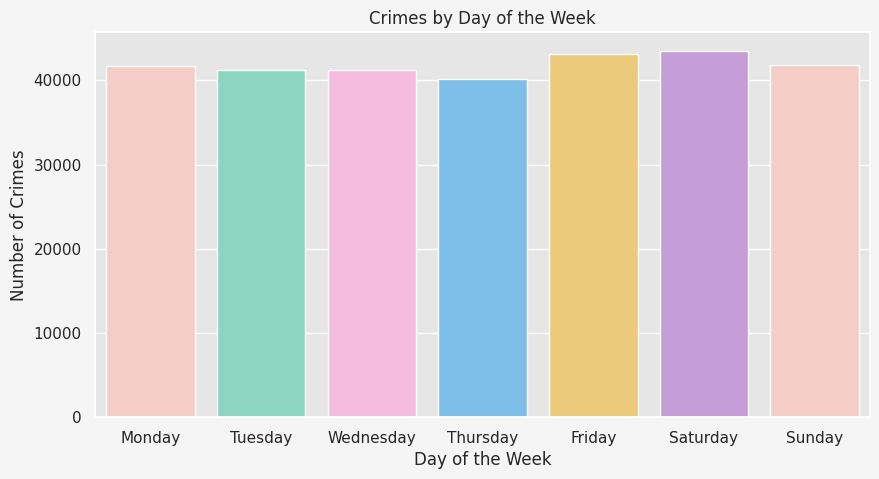

/tmp/ipykernel_58/1027359992.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=hourly_counts.index, y=hourly_counts, palette=palette)
/tmp/ipykernel_58/1027359992.py:25: UserWarning: 
The palette list has fewer values (6) than needed (24) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x=hourly_counts.index, y=hourly_counts, palette=palette)


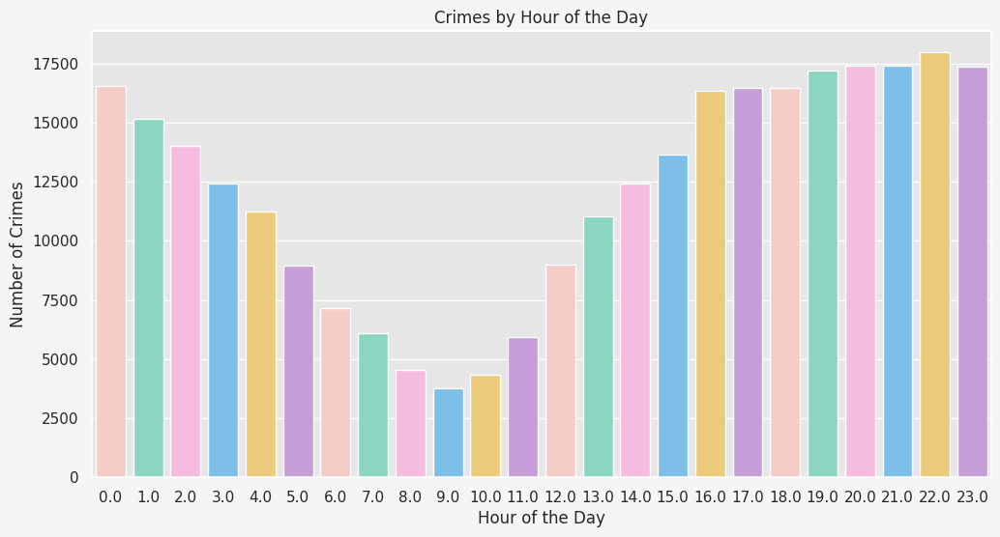

In [ ]:
df = pd.read_csv("./DC_Crime_Data.csv")
df['START_DATE'] = pd.to_datetime(df['START_DATE'])
df['END_DATE'] = pd.to_datetime(df['END_DATE'])

df['DAY_OF_WEEK'] = df['START_DATE'].dt.dayofweek
weekday_counts = df['DAY_OF_WEEK'].value_counts().sort_index()
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

plt.figure(figsize=(10,5))
sns.barplot(x=days, y=weekday_counts, palette=palette)
plt.title('Crimes by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Crimes')
plt.show()

df['HOUR'] = df['START_DATE'].dt.hour
hourly_counts = df['HOUR'].value_counts().sort_index()

plt.figure(figsize=(12,6))
sns.barplot(x=hourly_counts.index, y=hourly_counts, palette=palette)
plt.title('Crimes by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Crimes')
plt.xticks(ticks=range(24), rotation=0)
plt.show()

Si nota come il maggior numero di crimini è registrato alle ore 22 mentre il minor numero di crimini si registra alle 9 di mattina.

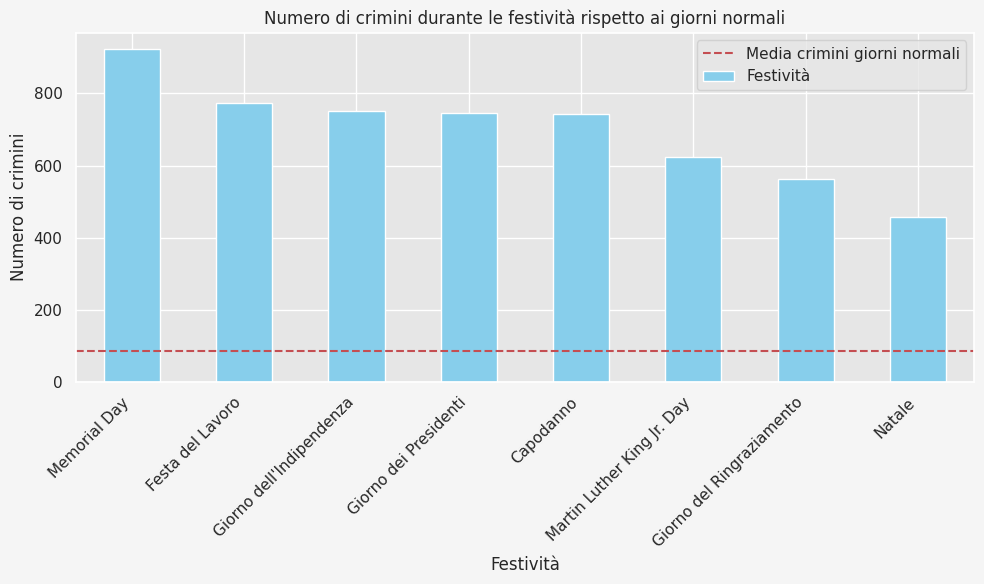

In [ ]:
df = pd.read_csv("./DC_Crime_Data.csv")
df['START_DATE'] = pd.to_datetime(df['START_DATE'])
df['END_DATE'] = pd.to_datetime(df['END_DATE'])

holidays = [
    'Capodanno', 'Martin Luther King Jr. Day', 'Giorno dei Presidenti',
    'Memorial Day', 'Giorno dell\'Indipendenza', 'Festa del Lavoro',
    'Giorno del Ringraziamento', 'Natale'
]

def is_holiday(date):
    if date.month == 1 and date.day == 1:
        return 'Capodanno'
    elif date.month == 1 and date.day == 1 + (1 - date.weekday()) % 7:
        return 'Martin Luther King Jr. Day'
    elif date.month == 2 and date.day == 1 + (1 - date.weekday()) % 7:
        return 'Giorno dei Presidenti'
    elif date.month == 5 and date.day == 31 - (date.weekday() + 1) % 7:
        return 'Memorial Day'
    elif date.month == 7 and date.day == 4:
        return 'Giorno dell\'Indipendenza'
    elif date.month == 9 and date.day == 1 + (1 - date.weekday()) % 7:
        return 'Festa del Lavoro'
    elif date.month == 11 and date.weekday() == 3 and 22 <= date.day <= 28:
        return 'Giorno del Ringraziamento'
    elif date.month == 12 and date.day == 25:
        return 'Natale'
    else:
        return None

df['Holiday'] = df['START_DATE'].apply(is_holiday)

holiday_crimes = df[df['Holiday'].notna()]
holiday_counts = holiday_crimes['Holiday'].value_counts()

non_holiday_crimes = df[df['Holiday'].isna()]
unique_dates = df['START_DATE'].dt.date.nunique()
holiday_dates = holiday_crimes['START_DATE'].dt.date.nunique()
non_holiday_dates = unique_dates - holiday_dates
average_non_holiday_crimes = non_holiday_crimes.shape[0] / non_holiday_dates

plt.figure(figsize=(10, 6))
holiday_counts.plot(kind='bar', color='skyblue', label='Festività')
plt.axhline(y=average_non_holiday_crimes, color='r', linestyle='--', label='Media crimini giorni normali')
plt.title('Numero di crimini durante le festività rispetto ai giorni normali')
plt.xlabel('Festività')
plt.ylabel('Numero di crimini')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
df = pd.read_csv("./DC_Crime_Data.csv")
df1 = pd.read_csv("./crimeDC_24.csv")
df2 = pd.read_csv("./crime_dc.csv")

print(df.info())
print(df1.info())
print(df2.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292906 entries, 0 to 292905
Data columns (total 25 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   X                     292906 non-null  float64
 1   Y                     292906 non-null  float64
 2   CCN                   292906 non-null  int64  
 3   REPORT_DAT            292906 non-null  object 
 4   SHIFT                 292906 non-null  object 
 5   METHOD                292906 non-null  object 
 6   OFFENSE               292906 non-null  object 
 7   BLOCK                 292905 non-null  object 
 8   XBLOCK                292906 non-null  float64
 9   YBLOCK                292906 non-null  float64
 10  WARD                  292871 non-null  float64
 11  ANC                   292900 non-null  object 
 12  DISTRICT              292241 non-null  float64
 13  PSA                   292195 non-null  float64
 14  NEIGHBORHOOD_CLUSTER  291702 non-null  object 
 15  

In [ ]:
df = pd.read_csv("./DC_Crime_Data.csv")
df.rename(columns={
    'CCN': 'ccn',
    'REPORT_DAT': 'report_date',
    'SHIFT': 'shift',
    'METHOD': 'method',
    'OFFENSE': 'offense',
    'BLOCK': 'block',
    'XBLOCK': 'xblock',
    'YBLOCK': 'yblock',
    'WARD': 'ward',
    'ANC': 'anc',
    'DISTRICT': 'district',
    'PSA': 'psa',
    'NEIGHBORHOOD_CLUSTER': 'neighborhood_cluster',
    'BLOCK_GROUP': 'block_group',
    'CENSUS_TRACT': 'census_tract',
    'VOTING_PRECINCT': 'voting_precinct',
    'LATITUDE': 'latitude',
    'LONGITUDE': 'longitude',
    'BID': 'bid',
    'START_DATE': 'start_date',
    'END_DATE': 'end_date',
    'OBJECTID': 'objectid',
    'OCTO_RECORD_ID': 'octo_record_id'
}, inplace=True)

df.drop(columns=['X','Y','objectid','octo_record_id'], inplace=True)
columns_of_interest = ['ccn', 'report_date', 'shift', 'method', 'offense', 'block', 'xblock', 'yblock', 
                       'ward', 'anc', 'district', 'psa', 'neighborhood_cluster', 'block_group', 
                       'census_tract', 'voting_precinct', 'latitude', 'longitude', 'bid', 
                       'start_date', 'end_date']

columns_of_interest_new = ['ccn', 'report_date', 'shift', 'method', 'offense', 'block', 'xblock', 'yblock', 
                           'ward', 'anc', 'district', 'psa', 'neighborhood_cluster', 'block_group', 
                           'census_tract', 'voting_precinct', 'latitude', 'longitude', 'bid', 
                           'start_date', 'end_date']
df1 = pd.read_csv("./crimeDC_24.csv", usecols=columns_of_interest_new)
df2 = pd.read_csv("./crime_dc.csv", usecols=columns_of_interest_new)

df = pd.concat([df, df1, df2], ignore_index=True)

print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 353922 entries, 0 to 353921
Data columns (total 21 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   ccn                   353922 non-null  int64  
 1   report_date           353922 non-null  object 
 2   shift                 353922 non-null  object 
 3   method                353922 non-null  object 
 4   offense               353922 non-null  object 
 5   block                 353921 non-null  object 
 6   xblock                353922 non-null  float64
 7   yblock                353922 non-null  float64
 8   ward                  353880 non-null  float64
 9   anc                   353909 non-null  object 
 10  district              353257 non-null  float64
 11  psa                   352752 non-null  float64
 12  neighborhood_cluster  352713 non-null  object 
 13  block_group           353581 non-null  object 
 14  census_tract          353583 non-null  float64
 15  

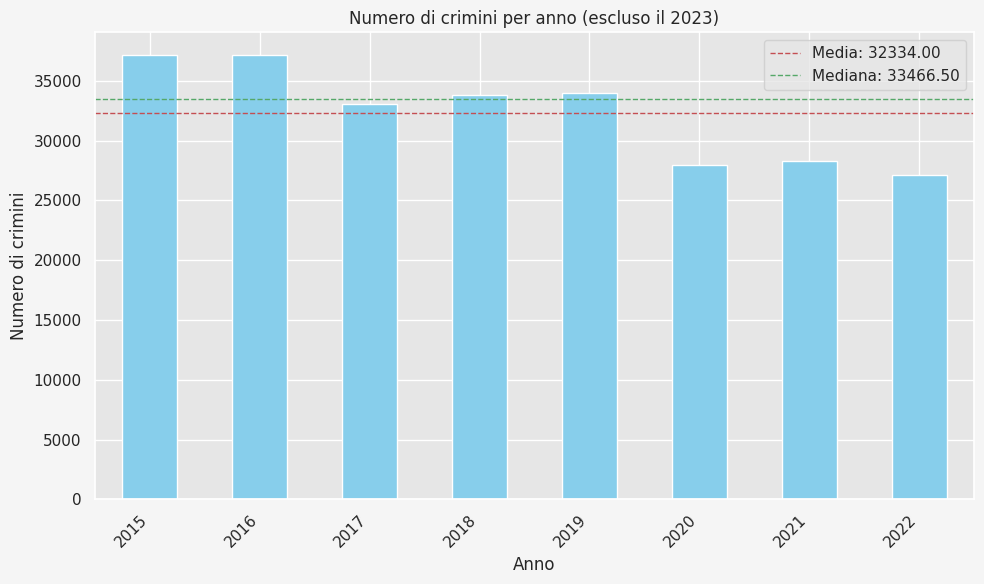

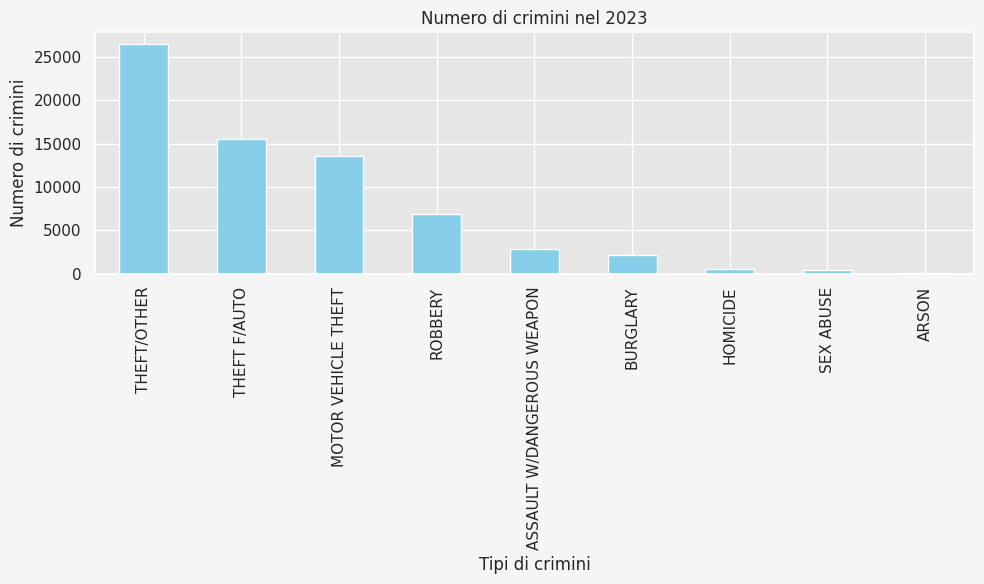

In [ ]:
df['report_date'] = pd.to_datetime(df['report_date'], errors='coerce')
df['start_date'] = pd.to_datetime(df['start_date'], errors='coerce')
df['end_date'] = pd.to_datetime(df['end_date'], errors='coerce')

df['year'] = df['report_date'].dt.year

df_excl_2023 = df[(df['year'] != 2023) & (df['year'] != 2024)]

crimes_per_year = df_excl_2023.groupby('year')['offense'].value_counts().unstack(fill_value=0)

yearly_stats = crimes_per_year.describe()

crimes_per_year_sum = crimes_per_year.sum(axis=1)

mean_crimes = crimes_per_year_sum.mean()
median_crimes = crimes_per_year_sum.median()

crimes_per_year_sum.index = crimes_per_year_sum.index.astype(int)

plt.figure(figsize=(10, 6))
crimes_per_year_sum.plot(kind='bar', color='skyblue')
plt.title('Numero di crimini per anno (escluso il 2023)')
plt.xlabel('Anno')
plt.ylabel('Numero di crimini')
plt.axhline(mean_crimes, color='r', linestyle='dashed', linewidth=1, label=f'Media: {mean_crimes:.2f}')
plt.axhline(median_crimes, color='g', linestyle='dashed', linewidth=1, label=f'Mediana: {median_crimes:.2f}')
plt.legend()
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

df_2023 = df[df['year'] == 2023]
crimes_2023 = df_2023['offense'].value_counts()

plt.figure(figsize=(10, 6))
crimes_2023.plot(kind='bar', color='skyblue')
plt.title('Numero di crimini nel 2023')
plt.xlabel('Tipi di crimini')
plt.ylabel('Numero di crimini')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


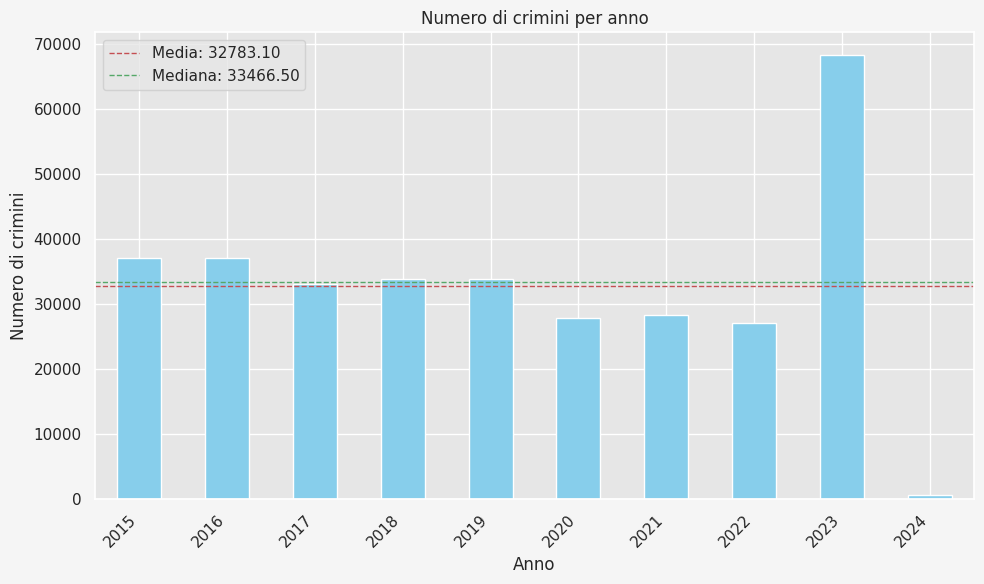

In [ ]:
df['report_date'] = pd.to_datetime(df['report_date'], errors='coerce')
df['start_date'] = pd.to_datetime(df['start_date'], errors='coerce')
df['end_date'] = pd.to_datetime(df['end_date'], errors='coerce')

df['year'] = df['report_date'].dt.year


crimes_per_year = df.groupby('year')['offense'].value_counts().unstack(fill_value=0)

crimes_per_year_sum = crimes_per_year.sum(axis=1)

mean_crimes = crimes_per_year_sum.mean()
median_crimes = crimes_per_year_sum.median()

crimes_per_year_sum.index = crimes_per_year_sum.index.astype(int)

plt.figure(figsize=(10, 6))
crimes_per_year_sum.plot(kind='bar', color='skyblue')
plt.title('Numero di crimini per anno')
plt.xlabel('Anno')
plt.ylabel('Numero di crimini')
plt.axhline(mean_crimes, color='r', linestyle='dashed', linewidth=1, label=f'Media: {mean_crimes:.2f}')
plt.axhline(median_crimes, color='g', linestyle='dashed', linewidth=1, label=f'Mediana: {median_crimes:.2f}')
plt.legend()
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=98e87a43-6c90-4512-8ed1-10b4fb704d83' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>